In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Nov  2 19:51:44 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    57W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

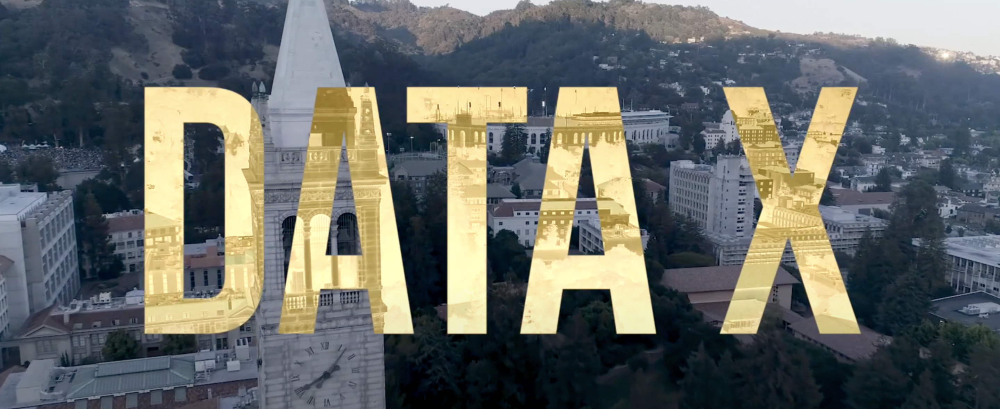

**UC Berkeley**

**Institution**: Sutardja Center for Entreprenurship & Technology (SCET)

**Course**: Data-X (INDENG 135 / 235)

**Semester**: Fall 2021

**Authors & Reviewers**: Ruiqi Guo, Mario Filho & Derek S. Chan

**Updated**: Thursday, 9/30/2021 PST

**Notebook learning objective**: 
* Leverage a pre-trained [Trainsformer](https://towardsdatascience.com/transformers-explained-visually-part-1-overview-of-functionality-95a6dd460452) model named [Bidirectional Encoder Representations from Transformers(BERT)](https://towardsdatascience.com/ bert-explained-state-of-the-art-language-model-for-nlp-f8b21a9b6270) for the NLP applications.
* For this notebook case study, a text classifier based on BERT model is developed to detect [suicide ideation](https://www.kaggle.com/nikhileswarkomati/suicide-watch).
* The text classifier is evaluated and deployed for new data inputs.

If the notebook is in GitHub, you also can access at:https://github.com/scetx/datax/blob/master/05-data-x-natural-language/m530_NLPDL_BERT.ipynb

# STEP1:Importing required modules and load dataset


### **a. Imports**

In [ ]:
%%capture --no-display
# Install the transformer model in huggingface
# https://huggingface.co/transformers/installation.html
!pip install transformers 

In [ ]:
# import packages and modules to access and call their functions later
import pandas as pd
import torch
import matplotlib.pyplot as plt
import os
import random
import time
import zipfile
import transformers
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from transformers import DistilBertTokenizerFast
from transformers import DistilBertForSequenceClassification, Trainer, TrainingArguments
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import glob
import tensorflow as tf
from tensorflow.python.summary.summary_iterator import summary_iterator

import numpy as np
import os

!git clone https://github.com/loier13/IEOR235.git

fatal: destination path 'IEOR235' already exists and is not an empty directory.


In [ ]:
# https://stackoverflow.com/questions/60013721/how-to-see-complete-rows-in-google-colab
# show all lines in Pandas dataframe output
%load_ext google.colab.data_table

### **b. Open datasets**

In [ ]:
n_sample = 300

df_readin_E = pd.read_csv('IEOR235/all_reviews/reviews_E_labeled.csv', sep = ';').drop('E_naive', axis = 1).dropna()
df_readin_E.pop('Unnamed: 0')
df_readin_E = df_readin_E.groupby('E').sample(n_sample, replace = True)

df_readin_S = pd.read_csv('IEOR235/all_reviews/reviews_S_labeled.csv', sep = ';').drop('S_naive', axis = 1).dropna()
df_readin_S.pop('Unnamed: 0')
df_readin_S = df_readin_S.groupby('S').sample(n_sample, replace = True)
df_readin_S.S = df_readin_S.S.astype(int)

df_readin_G = pd.read_csv('IEOR235/all_reviews/reviews_G_labeled.csv', sep = ';').drop('G_naive', axis = 1).dropna()
df_readin_G.pop('Unnamed: 0')
df_readin_G = df_readin_G.groupby('G').sample(n_sample, replace = True)
df_readin_S = df_readin_S.groupby('S').sample(n_sample, replace = True)
df_readin_G.G = df_readin_G.G.astype(int)

df_readin_S.head()

,Id,text,S
2656,3848,Great benefits and compensation package.,0
952,1392,"Attractive pay Perfect boss, mentor and collea...",0
98,139,Paid me in time & correctly Best 1980’s manage...,0
3208,4583,"Structured Good benefits: medical, dental 401k...",0
5656,8082,Good people to work with.,0


Text(0.5, 0, 'Governance')

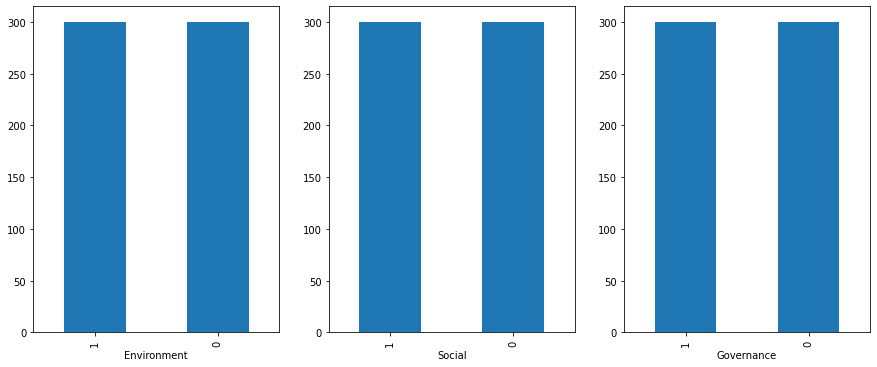

In [ ]:

# Call the value_counts function of pandas dataframe to get the total numbers of unique elements in specific column 
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.value_counts.html
Unique_value_count_E=df_readin_E['E'].value_counts(sort=True, ascending=False)
Unique_value_count_S=df_readin_S['S'].value_counts(sort=True, ascending=False)
Unique_value_count_G=df_readin_G['G'].value_counts(sort=True, ascending=False)

# Use the plot function with kind='bar' of dataframe to get the histogram with element name and corresponding number of samples
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html

fig, ax1 = plt.subplots(1, 3, figsize=(15,6))
Unique_value_count_E.plot(kind='bar', ax = ax1[0])
Unique_value_count_S.plot(kind='bar', ax = ax1[1])
Unique_value_count_G.plot(kind='bar', ax = ax1[2])


ax1[0].set_xlabel("Environment")
ax1[1].set_xlabel("Social")
ax1[2].set_xlabel("Governance")

# STEP2:Tokenize input & create training set and testing set 


We do the following tasks separately for E, S and G classifiers.

In [ ]:
# Split the training and testing set with train_test_split
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
Xtrain_E, Xval_E = train_test_split(df_readin_E[['text', 'E']], random_state=0, test_size=0.2)
Xtrain_S, Xval_S = train_test_split(df_readin_S[['text', 'S']], random_state=0, test_size=0.2) 
Xtrain_G, Xval_G = train_test_split(df_readin_G[['text', 'G']], random_state=0, test_size=0.2) 
print(Xtrain_E.shape, Xval_E.shape)

(480, 2) (120, 2)


In [ ]:
# For BERT model, the text inputs must be converted to tokens with tokenizer
# Here we use a distiled version of BERT base model (DistilBERT) for fast prototyping
# https://huggingface.co/distilbert-base-cased 
# The tokenizer to use is the pretrained DistilBERT tokenizer
# https://huggingface.co/transformers/model_doc/distilbert.html#transformers.DistilBertTokenizer
# Feel free to try on different pretrained BERT model for your own applications but please remember to match the tokenizer with
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-cased')

In [ ]:
# With the selected tokenizer, prepare the inputs and labels with correct datatype 
tokenized_train_E = tokenizer(Xtrain_E['text'].tolist(), padding="max_length", truncation=True)# The dataset input has to be list of strings 
tokenized_val_E = tokenizer(Xval_E['text'].tolist(), padding="max_length", truncation=True)
train_labels_E=Xtrain_E['E'].tolist()
val_labels_E=Xval_E['E'].tolist()


tokenized_train_S = tokenizer(Xtrain_S['text'].tolist(), padding="max_length", truncation=True)# The dataset input has to be list of strings 
tokenized_val_S = tokenizer(Xval_S['text'].tolist(), padding="max_length", truncation=True)
train_labels_S=Xtrain_S['S'].tolist()
val_labels_S=Xval_S['S'].tolist()


tokenized_train_G = tokenizer(Xtrain_G['text'].tolist(), padding="max_length", truncation=True)# The dataset input has to be list of strings 
tokenized_val_G = tokenizer(Xval_G['text'].tolist(), padding="max_length", truncation=True)
train_labels_G=Xtrain_G['G'].tolist()
val_labels_G=Xval_G['G'].tolist()

In [ ]:
# Create the DataSet with pytorch modules
# https://pytorch.org/docs/stable/data.html
class MYDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)


train_dataset_E = MYDataset(tokenized_train_E, train_labels_E)
val_dataset_E = MYDataset(tokenized_val_E, val_labels_E)

train_loader_E = DataLoader(train_dataset_E, batch_size=20, shuffle=False)
val_loader_E = DataLoader(val_dataset_E, batch_size=20, shuffle=False)



train_dataset_S = MYDataset(tokenized_train_S, train_labels_S)
val_dataset_S = MYDataset(tokenized_val_S, val_labels_S)

train_loader_S = DataLoader(train_dataset_S, batch_size=20, shuffle=False)
val_loader_S = DataLoader(val_dataset_S, batch_size=20, shuffle=False)



train_dataset_G = MYDataset(tokenized_train_E, train_labels_G)
val_dataset_G = MYDataset(tokenized_val_G, val_labels_G)

train_loader_G = DataLoader(train_dataset_G, batch_size=20, shuffle=False)
val_loader_G = DataLoader(val_dataset_G, batch_size=20, shuffle=False)

# STEP3: Define pretrained model and evaluate performance

From here, we only work on the S classifier because of "CUDA out of memory" issues. The commands are the same for E and G and are in comments.

In [ ]:
# Actuvate GPU runtime by calling cuda
# https://pytorch.org/docs/stable/generated/torch.cuda.device.html?highlight=torch%20device#torch.cuda.device
device = torch.device("cuda")
# Find the DistilBert model for sequence classification
# 
#model_E = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased")
model_S = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased") 
#model_G = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased") 

# Assign model to the GPU device
#model_E.to(device)
model_S.to(device)
#model_G.to(device)


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.weight', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier.bias', 'classifier.weight', 'classifier

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
       

In [ ]:
# Here we create a function predict_dataset with the model and dataloader as input
# Output the true label and predicted label as y_true and y_predict
def predict_dataset(mod,loader):
  y_true=[]
  y_predict=[]
  for batch in loader:
    # In batch dictionary, there are a keys for input_ids, attention_mask and labels
    # These three inputs are necessary for DistilBertForSequenceClassification model
    input_ids = batch['input_ids'].to(device)
    attention_mask = batch['attention_mask'].to(device)
    labels = batch['labels'].to(device)
    outputs = mod(input_ids, attention_mask=attention_mask, labels=labels)
    # outputs[0] or outputs.loss is the loss and outputs[1] or outputs.logit is the logit
    # use torch.argmax to give the one-hot encoding predictions of logits.
    # https://huggingface.co/transformers/main_classes/output.html
    predictions=torch.argmax(outputs.logits, dim=1)
    # To call the numpy, you must move the gpu tensors to cpu
    y_true_batch=labels.cpu().detach().numpy() 
    y_predict_batch=predictions.cpu().detach().numpy()
    for i in y_true_batch:
      y_true.append(i)
    for j in y_predict_batch:
      y_predict.append(j)
    # Delete the tensors with gradients to save GPU memory
    del input_ids
    del attention_mask
    del labels
    del outputs
    del predictions
  y_true=np.array(y_true)
  y_predict=np.array(y_predict)
  return y_true,y_predict

In [ ]:
# Get the true label and predicted label for testing and training set respectively
#y_true_val_E,y_predict_val_E=predict_dataset(model_E,val_loader_E)
#y_true_train_E,y_predict_train_E=predict_dataset(model_E,train_loader_E)

y_true_val_S,y_predict_val_S=predict_dataset(model_S,val_loader_S)
y_true_train_S,y_predict_train_S=predict_dataset(model_S,train_loader_S)

#y_true_val_G,y_predict_val_G=predict_dataset(model_G,val_loader_G)
#y_true_train_G,y_predict_train_G=predict_dataset(model_G,train_loader_G)


In [ ]:
# Create a function that gives classification report and confusion matrix
def Classification_Evaluate_E(y_true,y_predict):
  target_names = ['non-E', 'E']
  # Use the classification_report module to generate classification report
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
  print(classification_report(y_true, y_predict, target_names=target_names))
  # Use the confusion_matrix module to generate confusion matrix
  # Use ConfusionMatrixDisplay to display confusion matrix with lable classes
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay
  cm = confusion_matrix(y_true, y_predict)
  print(cm)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
  disp.plot()


def Classification_Evaluate_S(y_true,y_predict):
  target_names = ['non-S', 'S']
  # Use the classification_report module to generate classification report
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
  print(classification_report(y_true, y_predict, target_names=target_names))
  # Use the confusion_matrix module to generate confusion matrix
  # Use ConfusionMatrixDisplay to display confusion matrix with lable classes
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay
  cm = confusion_matrix(y_true, y_predict)
  print(cm)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
  disp.plot()


def Classification_Evaluate_G(y_true,y_predict):
  target_names = ['non-G', 'G']
  # Use the classification_report module to generate classification report
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
  print(classification_report(y_true, y_predict, target_names=target_names))
  # Use the confusion_matrix module to generate confusion matrix
  # Use ConfusionMatrixDisplay to display confusion matrix with lable classes
  # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay
  cm = confusion_matrix(y_true, y_predict)
  print(cm)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
  disp.plot()


### **Performance evaluation for S classifier**

For our model, we do slightly better than random but it's not very satisfying (not enough labelled data).

#### **a. Train**

              precision    recall  f1-score   support

       non-S       0.53      0.45      0.49       244
           S       0.51      0.60      0.55       236

    accuracy                           0.52       480
   macro avg       0.52      0.52      0.52       480
weighted avg       0.52      0.52      0.52       480

[[109 135]
 [ 95 141]]


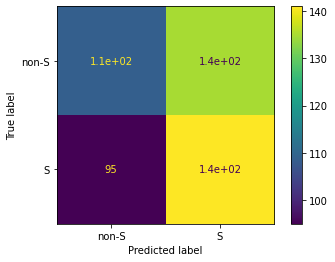

In [ ]:
# Performance Evaluation for training set with pre-trained naive model
#Classification_Evaluate(y_true_train_E,y_predict_train_E)
Classification_Evaluate_S(y_true_train_S,y_predict_train_S)
#Classification_Evaluate_G(y_true_train_G,y_predict_train_G)

#### **b. Validation evaluation**

              precision    recall  f1-score   support

       non-S       0.55      0.41      0.47        56
           S       0.58      0.70      0.63        64

    accuracy                           0.57       120
   macro avg       0.56      0.56      0.55       120
weighted avg       0.56      0.57      0.56       120

[[23 33]
 [19 45]]


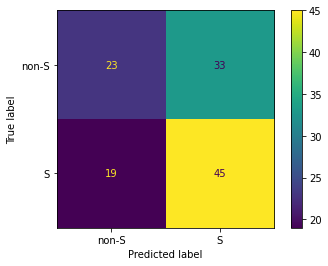

In [ ]:
# Performance Evaluation for testing set with pre-trained naive model
Classification_Evaluate_S(y_true_val_S,y_predict_val_S)

# STEP4: Train and evaluate the model with datasets

In [ ]:
# This cell would take 20-30 mins depending on the GPU allocated
# The TrainingArguments can customize the training process hyper parameters and evaluation settings
# https://huggingface.co/transformers/main_classes/trainer.html#transformers.TrainingArguments
training_args = TrainingArguments(
    output_dir='./results',          # output directory
    num_train_epochs=3,              # total number of training epochs
    per_device_train_batch_size=20,  # batch size per device during training
    per_device_eval_batch_size=40,   # batch size for evaluation
    warmup_steps=500,                # number of warmup steps for learning rate scheduler
    weight_decay=0.01,               # strength of weight decay
    logging_dir='./logs',            # directory for storing logs
    logging_steps=50,             # Record the logs every 10 steps
    do_eval=True,               # Include in the validation set performance evaluation
    evaluation_strategy="steps"        # Loss are calculated along as training step increases
)



trainer_S = Trainer(
    model=model_S,                         # the instantiated 🤗 Transformers model to be trained
    args=training_args,                  # training arguments, defined above
    train_dataset=train_dataset_S,         # training dataset
    eval_dataset=val_dataset_S             # evaluation dataset
)
# Execute the training
trainer_S.train()

***** Running training *****
  Num examples = 480
  Num Epochs = 3
  Instantaneous batch size per device = 20
  Total train batch size (w. parallel, distributed & accumulation) = 20
  Gradient Accumulation steps = 1
  Total optimization steps = 72


Step,Training Loss,Validation Loss
50,0.690700,0.678961


***** Running Evaluation *****
  Num examples = 120
  Batch size = 40


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=72, training_loss=0.6800238556332059, metrics={'train_runtime': 126.4208, 'train_samples_per_second': 11.391, 'train_steps_per_second': 0.57, 'total_flos': 190753054064640.0, 'train_loss': 0.6800238556332059, 'epoch': 3.0})

In [ ]:
# See the model architecture
model_S.eval()

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
       

In [ ]:
# Save model parameters in pytorch
# You will see the pytorchversion.pkl left hand side files after clicking refresh
# Please download this pickle file for future deployment purpose
torch.save(model_S.state_dict(), 'pytorchversion.pkl')

Performance evaluation after trainning the model
Here we can see the training f-1 score is improved to 0.96 & 0.92 for training and testing set respectively

In [ ]:
y_true_val_S,y_predict_val_S=predict_dataset(model_S,val_loader_S)
y_true_train_S,y_predict_train_S=predict_dataset(model_S,train_loader_S)

In [ ]:
#Inspecting misclassified samples in the validation to guide next improvement steps
for i in range(3):
  text_S = Xval_S[y_true_val_S != y_predict_val_S].iloc[i]['text']
  label_S = '?'
  #label = Xval[y_true_val != y_predict_val].iloc[i]['label']
  print("Text: {}\nLabel: {}\n".format(text_S, label_S))

Text: Lots to learn, high quality work. 
Label: ?

Text: Good benefits. good wlb. good career opportunities.. 
Label: ?

Text: Work life balance is usually pretty good. 
Label: ?



#### **a. Train evaluation**

Evaluations are better after the training on the dataset. It can still be improved, but this will come naturally with an extensive review labelling.

              precision    recall  f1-score   support

       non-S       0.67      0.79      0.73       244
           S       0.74      0.60      0.66       236

    accuracy                           0.70       480
   macro avg       0.70      0.70      0.69       480
weighted avg       0.70      0.70      0.70       480

[[193  51]
 [ 94 142]]


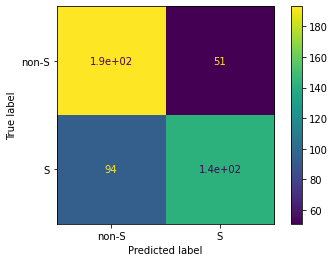

In [ ]:
Classification_Evaluate_S(y_true_train_S,y_predict_train_S)

#### **b. Validation evaluation**

              precision    recall  f1-score   support

       non-S       0.62      0.84      0.71        56
           S       0.80      0.55      0.65        64

    accuracy                           0.68       120
   macro avg       0.71      0.69      0.68       120
weighted avg       0.71      0.68      0.68       120

[[47  9]
 [29 35]]


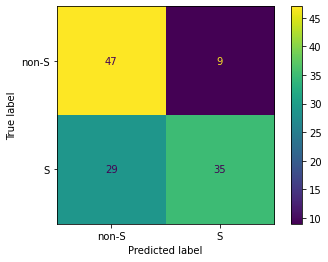

In [ ]:
Classification_Evaluate_S(y_true_val_S,y_predict_val_S)

In [ ]:
# The training process log data is saved in eventfile at /content/logs/
# Use the following commands to call tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/logs/

<IPython.core.display.Javascript object>

In [ ]:
# The training process log data is saved in eventfile at /content/logs/
# Define a function that extract the learning curves with summary_iterator
# http://tensorflow.biotecan.com/python/Python_1.8/tensorflow.google.cn/api_docs/python/tf/train/summary_iterator.html
def get_section_results(file):
    X = []
    Y = []
    for e in summary_iterator(file):
        for v in e.summary.value:
            if v.tag == 'train/loss':
                X.append(v.simple_value)
            elif v.tag == 'eval/loss':
                Y.append(v.simple_value)
    return X, Y

In [ ]:
path = '/content/logs/'
for i in os.listdir(path):
  if 'events'in i:
    e=i
    print(i)
logdir=os.path.join(path,e)
# Use glob to catch the eventfile
# https://docs.python.org/3/library/glob.html
eventfile = glob.glob(logdir)[0]
# Use the created function get_section_results to obtain learning curves
X, Y = get_section_results(eventfile)
st = np.arange(0,max(len(X),len(Y)))*50
X=np.array(X)
Y = np.array(Y)

events.out.tfevents.1635882874.c7a02e997b05.977.0
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


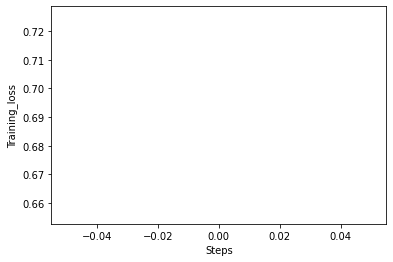

In [ ]:
# Plot training curve with the steps
plt.plot(st, X)
plt.xlabel('Steps')
plt.ylabel('Training_loss')
plt.show()
plt.close()

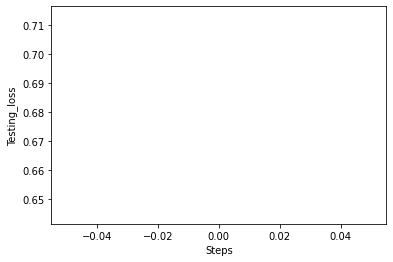

In [ ]:
# Plot testing curve with the steps
plt.plot(st, Y)
plt.xlabel('Steps')
plt.ylabel('Testing_loss')
plt.show()
plt.close()

In [ ]:
# Save learning curves to csv files
df_losscurve=pd.DataFrame({'steps':st,'Training_loss':X,'Testing_loss':Y})
df_losscurve.to_csv('losscurve.csv')

#STEP 5: Simple deployment
In this section we would continue with the saved model weigthts for deployment purposes. If you are execting the code with continued session, no extra steps need to be done.

If you are opening a new session, please re-run Step 1 and upload the pytorchversion.pkl to '/contents'.



In [ ]:
# Download and create naive model with the same pretrained model as your training process
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased")
device = torch.device("cuda")
# Load the saved weights to the pretrained the model
model.load_state_dict(torch.load('pytorchversion.pkl', map_location="cuda:0"))
model.to(device)

loading configuration file https://huggingface.co/distilbert-base-uncased/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/23454919702d26495337f3da04d1655c7ee010d5ec9d77bdb9e399e00302c0a1.91b885ab15d631bf9cee9dc9d25ece0afd932f2f5130eba28f2055b2220c0333
Model config DistilBertConfig {
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.11.2",
  "vocab_size": 30522
}

loading weights file https://huggingface.co/distilbert-base-uncased/resolve/main/pytorch_model.bin from cache at /root/.cache/huggingface/transformers/9c169103d7e5a73936dd2b627e42851bec0831212b677c637033ee4bce9

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
       

In [ ]:
# Create random input arguments
Input_arguments=["DataX is so fun!","I love the world!","Life is great! I am so happy!","Planning to end this terrible life"]
# Assumed dep_labels, with the same length of input arguments, if you don't know the exact labels just set them to zeros as example
dep_labels=[0] * len(Input_arguments)

In [ ]:
class MYDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-cased')

loading file https://huggingface.co/distilbert-base-cased/resolve/main/vocab.txt from cache at /root/.cache/huggingface/transformers/ba377304984dc63e3ede0e23a938bbbf04d5c3835b66d5bb48343aecca188429.437aa611e89f6fc6675a049d2b5545390adbc617e7d655286421c191d2be2791
loading file https://huggingface.co/distilbert-base-cased/resolve/main/tokenizer.json from cache at /root/.cache/huggingface/transformers/acb5c2138c1f8c84f074b86dafce3631667fccd6efcb1a7ea1320cf75c386a36.3dab63143af66769bbb35e3811f75f7e16b2320e12b7935e216bd6159ce6d9a6
loading file https://huggingface.co/distilbert-base-cased/resolve/main/added_tokens.json from cache at None
loading file https://huggingface.co/distilbert-base-cased/resolve/main/special_tokens_map.json from cache at None
loading file https://huggingface.co/distilbert-base-cased/resolve/main/tokenizer_config.json from cache at /root/.cache/huggingface/transformers/81e970e5e6ec68be12da0f8f3b2f2469c78d579282299a2ea65b4b7441719107.ec5c189f89475aac7d8cbd243960a0655cfad

In [ ]:
# Tokenize Input_arguments 
tokenized_dep = tokenizer(Input_arguments, padding="max_length", truncation=True)
# Make dep_dataset with Input_arguments and assumed dep_labels
dep_dataset = MYDataset(tokenized_dep, dep_labels)

In [ ]:
# get the y_predict of input tokens, similar to the function "predict_dataset" shown in STEP3
from torch.utils.data import DataLoader
dep_loader = DataLoader(dep_dataset, batch_size=1, shuffle=False)
y_predict=[]
device = torch.device("cuda")
for batch in dep_loader:
  input_ids = batch['input_ids'].to(device)
  attention_mask = batch['attention_mask'].to(device)
  labels = batch['labels'].to(device)
  outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
  predictions=torch.argmax(outputs.logits, dim=1)
  y_predict_batch=predictions.cpu().detach().numpy()
  for j in y_predict_batch:
    y_predict.append(j)
  del input_ids
  del attention_mask
  del labels
  del outputs
  del predictions
y_predict=np.array(y_predict)

In [ ]:
# Map the one hot encodings to the 'non-suicide' and 'suicide labels'
deployment_output=['non-suicide' if x==0 else 'suicide' for x in y_predict]
deployment_output

['non-suicide', 'non-suicide', 'non-suicide', 'suicide']